In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
%matplotlib inline

plt.style.use('_mpl-gallery')
sns.set(style='darkgrid')

In [4]:
wine_data = pd.read_csv('wine.data(1).csv')

In [5]:
wine_data.head(10)

,Label,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,OD280,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
5,1,14.20,1.76,2.45,15.2,112,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450
6,1,14.39,1.87,2.45,14.6,96,2.50,2.52,0.30,1.98,5.25,1.02,3.58,1290
7,1,14.06,2.15,2.61,17.6,121,2.60,2.51,0.31,1.25,5.05,1.06,3.58,1295
8,1,14.83,1.64,2.17,14.0,97,2.80,2.98,0.29,1.98,5.20,1.08,2.85,1045
9,1,13.86,1.35,2.27,16.0,98,2.98,3.15,0.22,1.85,7.22,1.01,3.55,1045


In [6]:
wine_data = wine_data.drop(columns=['Label'])

In [7]:
wine_data.columns

Index(['Alcohol', 'Malic acid', 'Ash', 'Alcalinity of ash', 'Magnesium',
       'Total phenols', 'Flavanoids', 'Nonflavanoid phenols',
       'Proanthocyanins', 'Color intensity', 'Hue', 'OD280', 'Proline'],
      dtype='object')

In [8]:
variables = ['Alcohol', 'Malic acid', 'Ash', 'Alcalinity of ash', 'Magnesium',
       'Total phenols', 'Flavanoids', 'Nonflavanoid phenols',
       'Proanthocyanins', 'Color intensity', 'Hue', 'OD280', 'Proline']

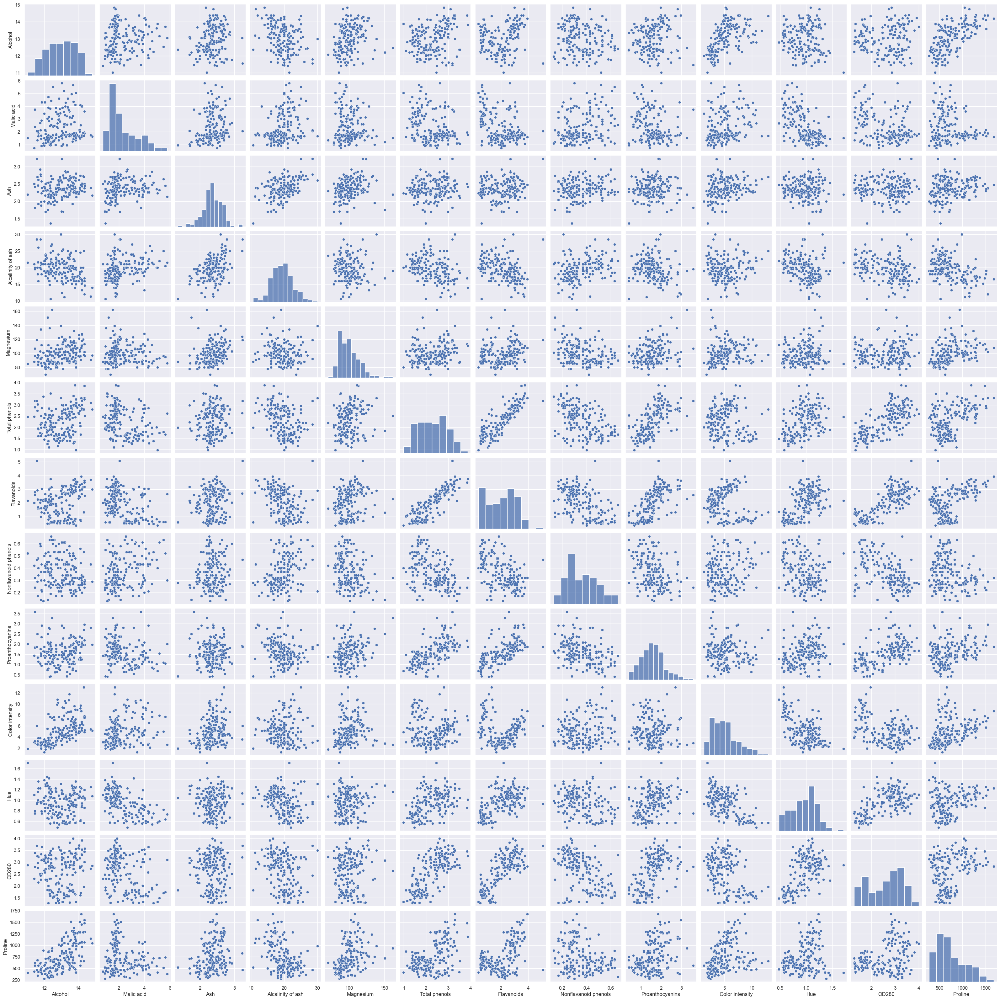

In [9]:
sns.pairplot(wine_data, vars=variables, kind='scatter')

The data base is normally distributed and there seems to be a correlation between the variables.

In [10]:
correlation=wine_data.corr()

<Axes: >

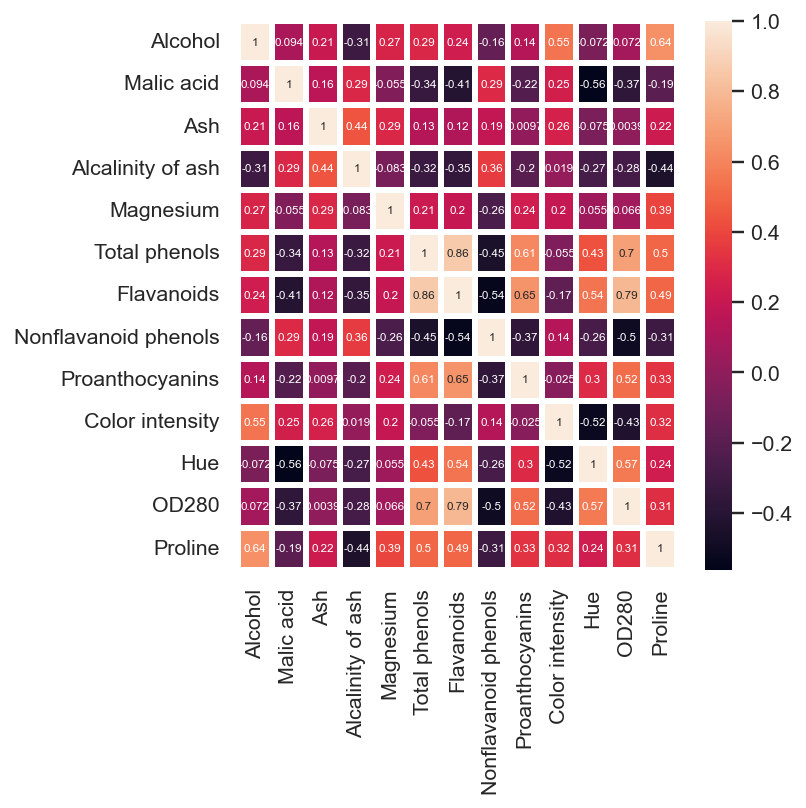

In [11]:
plt.figure(figsize=(4,4), dpi=140)

sns.heatmap(correlation, linewidths=3, annot=True, annot_kws={'fontsize':6})

Three Pairs of variables that have the largest correlation are 

1. Flavanoida and Total phenols : 0.86
2. OD280 and Flavaniods : 0.79
3. OD280 and Total phenols: 0.70

In [13]:
from sklearn.cluster import KMeans

kmc = KMeans(n_clusters = 3, random_state=0)
res = kmc.fit_predict(wine_data)

In [15]:
wine_data['cluster'] = res.astype('float64')

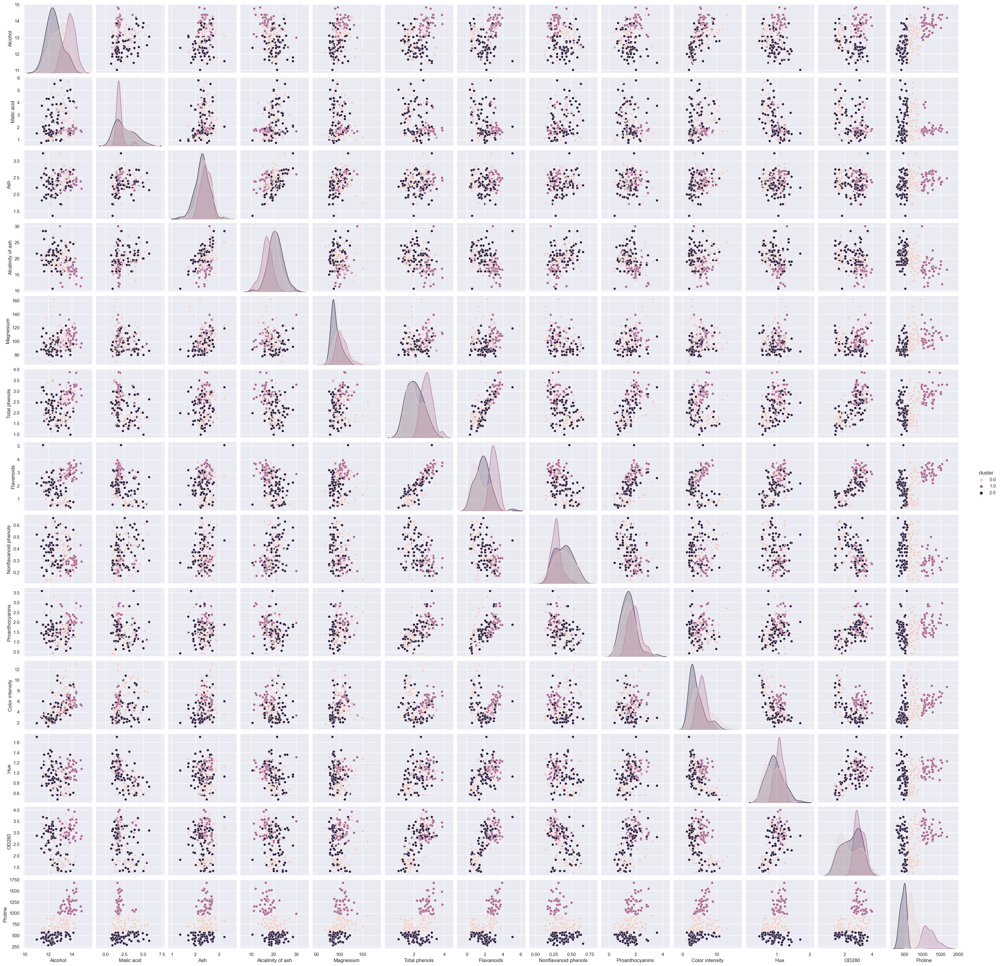

In [16]:
sns.pairplot(wine_data, hue='cluster')

Normalizing the data by removing the mean & scaling to unit variance using Standard Scaler

In [17]:
from sklearn.preprocessing import StandardScaler

In [20]:
standardscaler = StandardScaler()

In [21]:
standardscaler.fit(wine_data)

StandardScaler()

In [22]:
wine_scaled = standardscaler.transform(wine_data)

In [23]:
normalized_data = pd.DataFrame(wine_scaled, columns=wine_data.columns)

Performing the K means again

In [25]:
kmc_2=KMeans(n_clusters = 3, random_state=0)
res2 = kmc_2.fit_predict(normalized_data)

In [26]:
normalized_data['cluster'] = res2.astype('float64')

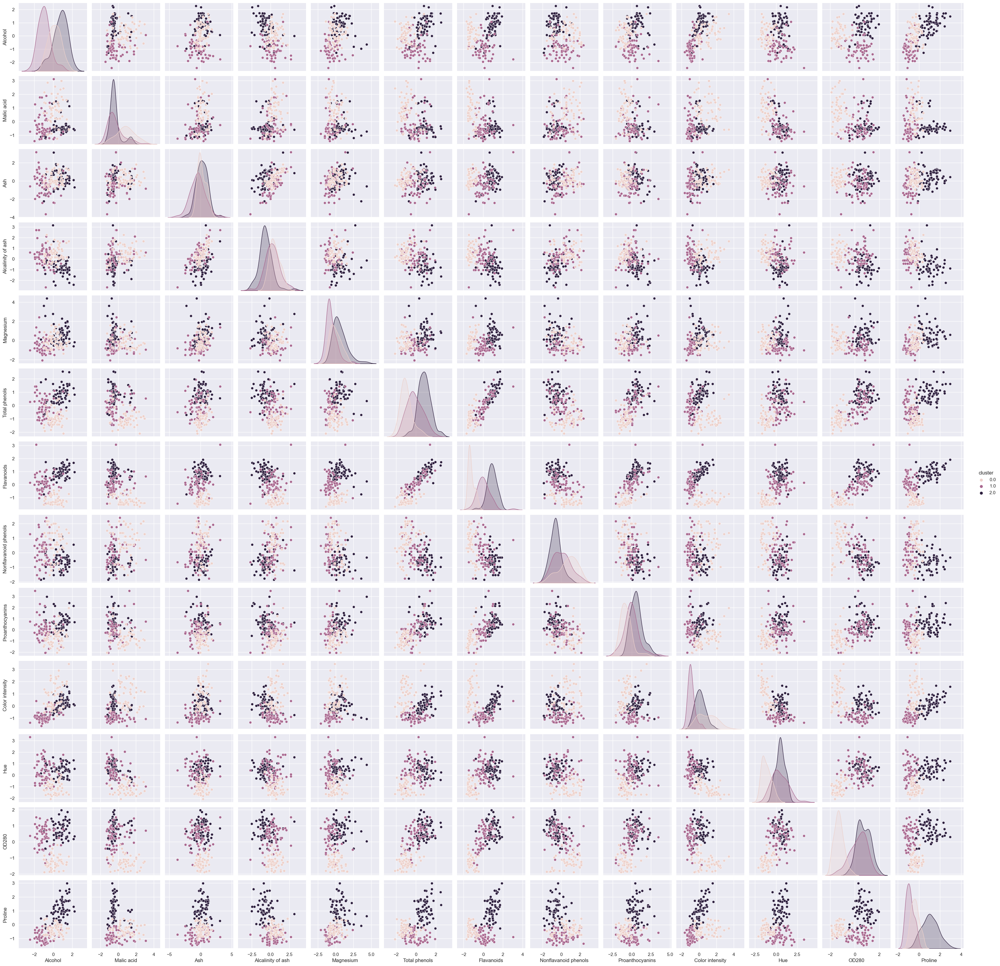

In [27]:
sns.pairplot(normalized_data, hue='cluster')